# Synthetic sensitivity results from `results_syn`

This notebook reads every input from `results_syn`. It rebuilds the Exp5 and Van Havre mean tables, prints LaTeX rows whose table-local ID always starts at 0, and recreates the RSETO-IPA sensitivity and variance figures.

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display

root_candidates = [Path.cwd(), *Path.cwd().parents]
PROJECT_ROOT = next(
    (path for path in root_candidates if (path / 'results_syn').is_dir()),
    None,
)
if PROJECT_ROOT is None:
    raise FileNotFoundError('Cannot locate the project results_syn directory.')

RESULTS_ROOT = PROJECT_ROOT / 'results_syn'
ETE_DETAIL_PATH = RESULTS_ROOT / 'consolidated_csv' / 'exp5_ete_models.csv'
OUTPUT_ROOT = RESULTS_ROOT / 'read_results_syn_analysis' / 'figures'
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)

DIMS = [4, 9, 14, 19, 24]
SEEDS = [82, 15, 4, 95, 36, 32, 29, 18, 14, 87]
SWEEP_INFO = {
    'lambda': {'column': 'lambda', 'symbol': r'$\lambda$', 'values': [0.1, 0.3, 0.5, 0.7, 0.9]},
    'm': {'column': 'm', 'symbol': r'$M$', 'values': [8, 32, 128, 512, 2048]},
    'simulation_num': {'column': 'simulation_num', 'symbol': r'$R$', 'values': [1, 4, 16, 64, 256]},
}

sns.set_theme(style='whitegrid', context='notebook')

In [3]:
import pandas as pd
import gurobipy as gp

m = gp.Model("license_test")


Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2790678
Academic license 2790678 - for non-commercial use only - registered to 23___@connect.polyu.hk


## Load and validate the consolidated tables

In [2]:
results_lambda = pd.read_excel(RESULTS_ROOT / 'syn_lambda_ipa.xlsx')
results_m = pd.read_excel(RESULTS_ROOT / 'syn_m_ipa.xlsx')
results_simulation_num = pd.read_excel(RESULTS_ROOT / 'syn_simulation_num_ipa.xlsx')
gendfl_spline = pd.read_excel(RESULTS_ROOT / 'syn_gendfl_spline.xlsx')
results_qfr = pd.read_excel(RESULTS_ROOT / 'syn_spline_qfr.xlsx')
ete_results = pd.read_csv(ETE_DETAIL_PATH)

ETE_MODEL_LABELS = {
    'erm': 'ERM',
    'lightgbm': 'LightGBM',
    'end_to_end': 'Benchmark',
    'oracle_gmm': 'BCMO',
}
if ete_results['error'].notna().any():
    failed = ete_results.loc[ete_results['error'].notna(), ['dim', 'random_state', 'model', 'error']]
    raise RuntimeError(f'ETE result file contains failed runs:\n{failed.to_string(index=False)}')
ete_results = ete_results[['dim', 'random_state', 'model', 'metric1', 'metric2']].copy()
ete_results['model'] = ete_results['model'].map(ETE_MODEL_LABELS)
if ete_results['model'].isna().any():
    raise ValueError('ETE result file contains an unknown model label.')

raw_sweeps = {
    'lambda': results_lambda,
    'm': results_m,
    'simulation_num': results_simulation_num,
}
required_metric_columns = {'dim', 'random_state', 'metric1', 'metric2'}
for sweep, frame in raw_sweeps.items():
    parameter_column = SWEEP_INFO[sweep]['column']
    required = required_metric_columns | {parameter_column}
    if not required.issubset(frame.columns):
        raise ValueError(f'{sweep} is missing columns: {sorted(required - set(frame.columns))}')
    expected_rows = len(DIMS) * len(SEEDS) * len(SWEEP_INFO[sweep]['values'])
    assert len(frame) == expected_rows, (sweep, len(frame), expected_rows)
    assert not frame.duplicated(['dim', 'random_state', parameter_column]).any()
    assert frame[['metric1', 'metric2']].notna().all().all()
    assert set(frame['dim']) == set(DIMS)
    assert set(frame['random_state']) == set(SEEDS)

for name, frame in {'GenDFL': gendfl_spline, 'Spline QFR': results_qfr}.items():
    assert required_metric_columns.issubset(frame.columns)
    assert len(frame) == len(DIMS) * len(SEEDS), (name, len(frame))
    assert not frame.duplicated(['dim', 'random_state']).any()
    assert frame[['metric1', 'metric2']].notna().all().all()

expected_ete_rows = len(DIMS) * len(SEEDS) * len(ETE_MODEL_LABELS)
assert len(ete_results) == expected_ete_rows, (len(ete_results), expected_ete_rows)
assert not ete_results.duplicated(['dim', 'random_state', 'model']).any()
assert ete_results[['metric1', 'metric2']].notna().all().all()
assert set(ete_results['dim']) == set(DIMS)
assert set(ete_results['random_state']) == set(SEEDS)
assert set(ete_results['model']) == set(ETE_MODEL_LABELS.values())

sensitivity_frames = []
for sweep, frame in raw_sweeps.items():
    current = frame.rename(columns={SWEEP_INFO[sweep]['column']: 'parameter'}).copy()
    current['sweep'] = sweep
    sensitivity_frames.append(
        current[['dim', 'random_state', 'sweep', 'parameter', 'metric1', 'metric2']]
    )
sensitivity_results = pd.concat(sensitivity_frames, ignore_index=True)

coverage = (
    sensitivity_results.groupby(['sweep', 'dim', 'parameter'])
    .size().rename('seed_runs').reset_index()
)
print(f'Loaded {len(sensitivity_results)} RSETO-IPA rows from {RESULTS_ROOT}.')
print(f'Loaded {len(ete_results)} seed-level ETE rows from {ETE_DETAIL_PATH}.')
display(coverage.groupby('sweep')['seed_runs'].agg(['min', 'max']))

Loaded 750 RSETO-IPA rows from /Users/seinzhou/Desktop/wsc_newexp/results_syn.
Loaded 200 seed-level ETE rows from /Users/seinzhou/Desktop/wsc_newexp/results_syn/consolidated_csv/exp5_ete_models.csv.


,min,max
sweep,,
lambda,10,10
m,10,10
simulation_num,10,10


## Rebuild mean tables and print LaTeX rows

Every method column is recomputed from seed-level results, including ERM, LightGBM, and Benchmark. The consolidated mean workbook is used only as an independent consistency check. Every call to `print_latex_rows` creates a fresh table-local ID sequence `0, 1, 2, 3, 4`.

In [3]:
MEAN_WORKBOOK = RESULTS_ROOT / 'synthetic_hyperparameter_mean_tables.xlsx'
ETE_COLUMNS = ['ERM', 'LightGBM', 'Benchmark']

def parameter_column_name(sweep, value):
    if sweep == 'lambda':
        return f'Lambda {float(value):.1f}'
    if sweep == 'm':
        return f'M {int(value)}'
    return f'R {int(value)}'

def build_mean_table(sweep, metric):
    values = SWEEP_INFO[sweep]['values']
    selected = sensitivity_results[sensitivity_results['sweep'] == sweep]
    sweep_mean = selected.pivot_table(
        index='dim', columns='parameter', values=metric, aggfunc='mean'
    ).reindex(index=DIMS, columns=values)
    sweep_mean.columns = [parameter_column_name(sweep, value) for value in values]

    gendfl_mean = gendfl_spline.groupby('dim')[metric].mean().reindex(DIMS).rename('GenDFL')
    qfr_mean = results_qfr.groupby('dim')[metric].mean().reindex(DIMS).rename('Spline QFR')
    ete_mean = ete_results.pivot_table(
        index='dim', columns='model', values=metric, aggfunc='mean'
    ).reindex(index=DIMS, columns=ETE_COLUMNS)
    saved = pd.read_excel(MEAN_WORKBOOK, sheet_name=f'{sweep}_{metric}').set_index('Dim')

    rebuilt = pd.concat([sweep_mean, gendfl_mean, qfr_mean, ete_mean], axis=1)
    rebuilt.index.name = 'Dim'
    rebuilt = rebuilt.reset_index()

    np.testing.assert_allclose(
        rebuilt.to_numpy(dtype=float),
        saved.reset_index()[rebuilt.columns].to_numpy(dtype=float),
        rtol=1e-10, atol=1e-10,
    )
    return rebuilt

def print_latex_rows(table):
    for latex_id, (_, row) in enumerate(table.reset_index(drop=True).iterrows()):
        numeric = pd.to_numeric(row.drop(labels='Dim'), errors='coerce')
        minimum = numeric.min()
        cells = [str(latex_id), str(int(row['Dim']))]
        for column in table.columns[1:]:
            value = float(row[column])
            formatted = f'{value:.2f}'
            if np.isclose(value, minimum, rtol=1e-10, atol=1e-10):
                formatted = rf'\textbf{{{formatted}}}'
            cells.append(formatted)
        print(' & '.join(cells) + ' ' + chr(92) * 2)

mean_tables = {}
latex_rows = {}
for sweep_name in SWEEP_INFO:
    for metric_name in ['metric1', 'metric2']:
        key = (sweep_name, metric_name)
        table = build_mean_table(*key)
        mean_tables[key] = table
        print(f'\n{sweep_name} - {metric_name} (LaTeX ID resets at 0)')
        display(table.style.format({
            column: '{:.2f}' for column in table.columns if column != 'Dim'
        }))
        print_latex_rows(table)


lambda - metric1 (LaTeX ID resets at 0)


,Dim,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,190.49,190.51,190.47,190.55,190.70,190.78,201.54,189.73,190.52,190.63
1,9,260.23,260.40,260.37,260.10,260.38,260.45,279.71,258.37,259.18,259.52
2,14,380.70,380.37,380.30,380.38,380.81,382.37,398.91,378.20,380.47,380.05
3,19,358.63,358.25,358.36,358.69,359.04,364.24,393.89,354.88,357.44,358.06
4,24,327.28,327.09,326.74,326.75,326.57,327.94,354.28,323.68,325.58,326.31


0 & 4 & 190.49 & 190.51 & 190.47 & 190.55 & 190.70 & 190.78 & 201.54 & \textbf{189.73} & 190.52 & 190.63 \\
1 & 9 & 260.23 & 260.40 & 260.37 & 260.10 & 260.38 & 260.45 & 279.71 & \textbf{258.37} & 259.18 & 259.52 \\
2 & 14 & 380.70 & 380.37 & 380.30 & 380.38 & 380.81 & 382.37 & 398.91 & \textbf{378.20} & 380.47 & 380.05 \\
3 & 19 & 358.63 & 358.25 & 358.36 & 358.69 & 359.04 & 364.24 & 393.89 & \textbf{354.88} & 357.44 & 358.06 \\
4 & 24 & 327.28 & 327.09 & 326.74 & 326.75 & 326.57 & 327.94 & 354.28 & \textbf{323.68} & 325.58 & 326.31 \\

lambda - metric2 (LaTeX ID resets at 0)


,Dim,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,220.17,210.02,206.41,205.67,205.40,205.37,217.23,313.57,314.24,314.02
1,9,298.82,279.10,272.87,271.39,271.18,271.16,287.57,383.61,387.32,385.86
2,14,351.94,336.71,333.93,333.18,333.48,332.76,345.71,475.18,474.85,477.49
3,19,428.60,407.89,397.18,393.95,393.27,392.77,414.92,610.47,600.78,610.93
4,24,351.57,339.59,335.91,332.25,331.42,331.62,357.41,461.79,461.25,452.91


0 & 4 & 220.17 & 210.02 & 206.41 & 205.67 & 205.40 & \textbf{205.37} & 217.23 & 313.57 & 314.24 & 314.02 \\
1 & 9 & 298.82 & 279.10 & 272.87 & 271.39 & 271.18 & \textbf{271.16} & 287.57 & 383.61 & 387.32 & 385.86 \\
2 & 14 & 351.94 & 336.71 & 333.93 & 333.18 & 333.48 & \textbf{332.76} & 345.71 & 475.18 & 474.85 & 477.49 \\
3 & 19 & 428.60 & 407.89 & 397.18 & 393.95 & 393.27 & \textbf{392.77} & 414.92 & 610.47 & 600.78 & 610.93 \\
4 & 24 & 351.57 & 339.59 & 335.91 & 332.25 & \textbf{331.42} & 331.62 & 357.41 & 461.79 & 461.25 & 452.91 \\

m - metric1 (LaTeX ID resets at 0)


,Dim,M 8,M 32,M 128,M 512,M 2048,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,190.37,190.52,190.47,190.49,190.48,190.78,201.54,189.73,190.52,190.63
1,9,260.78,260.44,260.37,260.51,260.44,260.45,279.71,258.37,259.18,259.52
2,14,380.51,380.37,380.30,380.32,380.53,382.37,398.91,378.20,380.47,380.05
3,19,358.36,358.26,358.36,358.24,358.45,364.24,393.89,354.88,357.44,358.06
4,24,326.66,326.62,326.74,327.27,327.24,327.94,354.28,323.68,325.58,326.31


0 & 4 & 190.37 & 190.52 & 190.47 & 190.49 & 190.48 & 190.78 & 201.54 & \textbf{189.73} & 190.52 & 190.63 \\
1 & 9 & 260.78 & 260.44 & 260.37 & 260.51 & 260.44 & 260.45 & 279.71 & \textbf{258.37} & 259.18 & 259.52 \\
2 & 14 & 380.51 & 380.37 & 380.30 & 380.32 & 380.53 & 382.37 & 398.91 & \textbf{378.20} & 380.47 & 380.05 \\
3 & 19 & 358.36 & 358.26 & 358.36 & 358.24 & 358.45 & 364.24 & 393.89 & \textbf{354.88} & 357.44 & 358.06 \\
4 & 24 & 326.66 & 326.62 & 326.74 & 327.27 & 327.24 & 327.94 & 354.28 & \textbf{323.68} & 325.58 & 326.31 \\

m - metric2 (LaTeX ID resets at 0)


,Dim,M 8,M 32,M 128,M 512,M 2048,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,208.80,207.01,206.41,206.33,206.43,205.37,217.23,313.57,314.24,314.02
1,9,276.02,272.94,272.87,272.85,273.29,271.16,287.57,383.61,387.32,385.86
2,14,341.32,336.30,333.93,333.52,333.87,332.76,345.71,475.18,474.85,477.49
3,19,405.71,397.84,397.18,397.02,396.87,392.77,414.92,610.47,600.78,610.93
4,24,335.40,335.28,335.91,333.93,334.13,331.62,357.41,461.79,461.25,452.91


0 & 4 & 208.80 & 207.01 & 206.41 & 206.33 & 206.43 & \textbf{205.37} & 217.23 & 313.57 & 314.24 & 314.02 \\
1 & 9 & 276.02 & 272.94 & 272.87 & 272.85 & 273.29 & \textbf{271.16} & 287.57 & 383.61 & 387.32 & 385.86 \\
2 & 14 & 341.32 & 336.30 & 333.93 & 333.52 & 333.87 & \textbf{332.76} & 345.71 & 475.18 & 474.85 & 477.49 \\
3 & 19 & 405.71 & 397.84 & 397.18 & 397.02 & 396.87 & \textbf{392.77} & 414.92 & 610.47 & 600.78 & 610.93 \\
4 & 24 & 335.40 & 335.28 & 335.91 & 333.93 & 334.13 & \textbf{331.62} & 357.41 & 461.79 & 461.25 & 452.91 \\

simulation_num - metric1 (LaTeX ID resets at 0)


,Dim,R 1,R 4,R 16,R 64,R 256,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,190.53,190.55,190.47,190.52,190.48,190.78,201.54,189.73,190.52,190.63
1,9,260.39,260.29,260.37,260.34,260.29,260.45,279.71,258.37,259.18,259.52
2,14,380.24,380.29,380.30,380.25,380.25,382.37,398.91,378.20,380.47,380.05
3,19,358.48,358.52,358.36,358.38,358.49,364.24,393.89,354.88,357.44,358.06
4,24,326.71,326.91,326.74,326.69,326.79,327.94,354.28,323.68,325.58,326.31


0 & 4 & 190.53 & 190.55 & 190.47 & 190.52 & 190.48 & 190.78 & 201.54 & \textbf{189.73} & 190.52 & 190.63 \\
1 & 9 & 260.39 & 260.29 & 260.37 & 260.34 & 260.29 & 260.45 & 279.71 & \textbf{258.37} & 259.18 & 259.52 \\
2 & 14 & 380.24 & 380.29 & 380.30 & 380.25 & 380.25 & 382.37 & 398.91 & \textbf{378.20} & 380.47 & 380.05 \\
3 & 19 & 358.48 & 358.52 & 358.36 & 358.38 & 358.49 & 364.24 & 393.89 & \textbf{354.88} & 357.44 & 358.06 \\
4 & 24 & 326.71 & 326.91 & 326.74 & 326.69 & 326.79 & 327.94 & 354.28 & \textbf{323.68} & 325.58 & 326.31 \\

simulation_num - metric2 (LaTeX ID resets at 0)


,Dim,R 1,R 4,R 16,R 64,R 256,GenDFL,Spline QFR,ERM,LightGBM,Benchmark
0,4,206.60,206.54,206.41,206.39,206.62,205.37,217.23,313.57,314.24,314.02
1,9,272.86,272.70,272.87,273.29,272.41,271.16,287.57,383.61,387.32,385.86
2,14,334.03,334.12,333.93,333.77,333.87,332.76,345.71,475.18,474.85,477.49
3,19,397.77,396.99,397.18,396.60,397.88,392.77,414.92,610.47,600.78,610.93
4,24,335.04,334.67,335.91,336.06,336.14,331.62,357.41,461.79,461.25,452.91


0 & 4 & 206.60 & 206.54 & 206.41 & 206.39 & 206.62 & \textbf{205.37} & 217.23 & 313.57 & 314.24 & 314.02 \\
1 & 9 & 272.86 & 272.70 & 272.87 & 273.29 & 272.41 & \textbf{271.16} & 287.57 & 383.61 & 387.32 & 385.86 \\
2 & 14 & 334.03 & 334.12 & 333.93 & 333.77 & 333.87 & \textbf{332.76} & 345.71 & 475.18 & 474.85 & 477.49 \\
3 & 19 & 397.77 & 396.99 & 397.18 & 396.60 & 397.88 & \textbf{392.77} & 414.92 & 610.47 & 600.78 & 610.93 \\
4 & 24 & 335.04 & 334.67 & 335.91 & 336.06 & 336.14 & \textbf{331.62} & 357.41 & 461.79 & 461.25 & 452.91 \\


## Confidence line plots

Each curve contains only RSETO-IPA results. The line is the ten-seed mean and the shaded region is a 95% normal confidence interval. One figure is generated for each hyperparameter sweep, with Metric 1 and Metric 2 side by side.

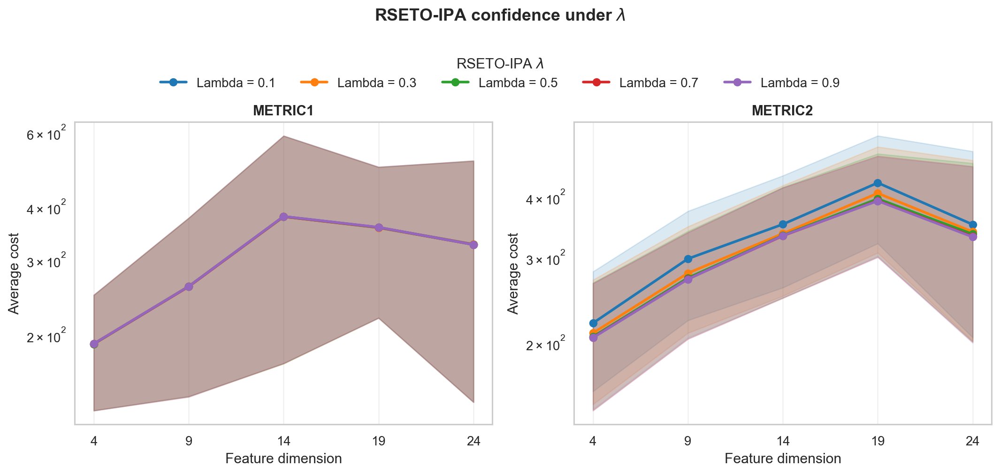

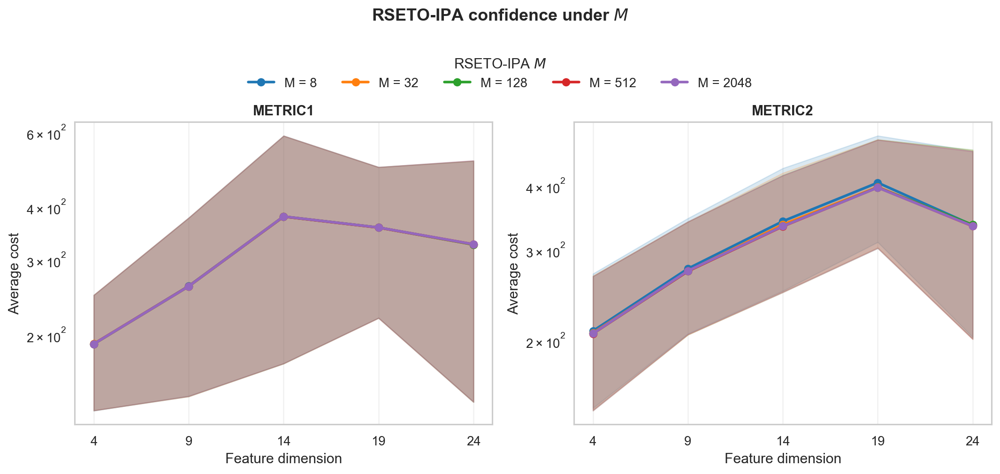

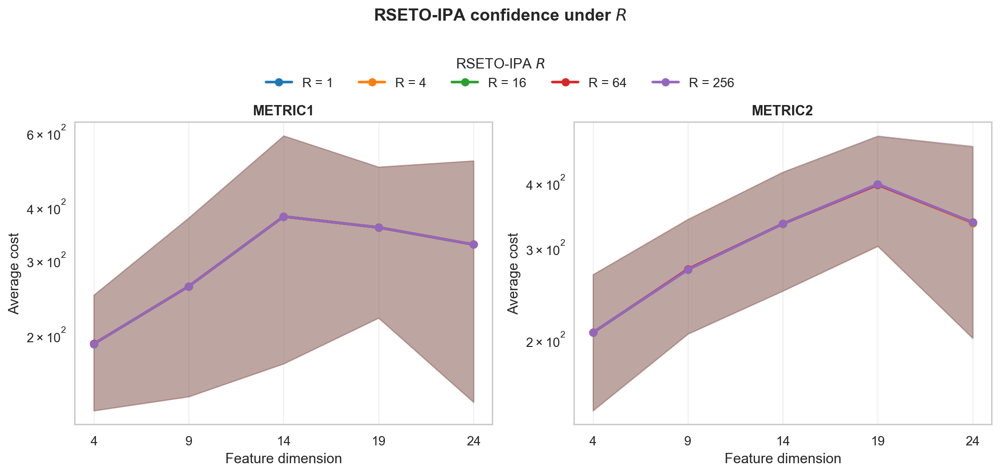

In [4]:
def confidence_stats(frame, group_column, metric):
    stats = (
        frame.groupby(group_column)[metric]
        .agg(mean='mean', std=lambda values: values.std(ddof=1), count='count')
        .reset_index().sort_values(group_column)
    )
    stats['ci95'] = 1.96 * stats['std'] / np.sqrt(stats['count'])
    stats['lower'] = stats['mean'] - stats['ci95']
    stats['upper'] = stats['mean'] + stats['ci95']
    return stats

def plot_rseto_parameter_confidence(sweep, save=True):
    selected = sensitivity_results[sensitivity_results['sweep'] == sweep]
    parameter_values = SWEEP_INFO[sweep]['values']
    symbol = SWEEP_INFO[sweep]['symbol']
    colors = sns.color_palette('tab10', n_colors=len(parameter_values))

    fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=180)
    for axis, metric in zip(axes, ['metric1', 'metric2']):
        for color, parameter_value in zip(colors, parameter_values):
            current = selected[np.isclose(selected['parameter'], parameter_value)]
            stats = confidence_stats(current, 'dim', metric)
            x = stats['dim'].to_numpy(dtype=float)
            mean = stats['mean'].to_numpy(dtype=float)
            lower = stats['lower'].to_numpy(dtype=float)
            upper = stats['upper'].to_numpy(dtype=float)
            label = parameter_column_name(sweep, parameter_value).replace(' ', ' = ')
            axis.plot(x, mean, color=color, linewidth=2.2, marker='o', label=label)
            axis.fill_between(x, lower, upper, color=color, alpha=0.16)
        axis.set_yscale('log')
        axis.set_xticks(DIMS)
        axis.set_xlabel('Feature dimension')
        axis.set_ylabel('Average cost')
        axis.set_title(metric.upper(), fontweight='bold')
        axis.grid(True, alpha=0.28)

    handles, labels = axes[0].get_legend_handles_labels()
    for axis in axes:
        legend = axis.get_legend()
        if legend is not None:
            legend.remove()
    fig.legend(
        handles, labels, title=f'RSETO-IPA {symbol}', loc='upper center',
        bbox_to_anchor=(0.5, 1.03), ncol=len(parameter_values), frameon=False,
    )
    fig.suptitle(f'RSETO-IPA confidence under {symbol}', fontweight='bold', y=1.12)
    fig.tight_layout()
    if save:
        stem = OUTPUT_ROOT / f'{sweep}_rseto_ipa_confidence'
        fig.savefig(stem.with_suffix('.png'), dpi=300, bbox_inches='tight')
        fig.savefig(stem.with_suffix('.pdf'), bbox_inches='tight')
    plt.show()
    return fig

confidence_figures = {
    sweep: plot_rseto_parameter_confidence(sweep) for sweep in SWEEP_INFO
}

## Seed-level line plots

Each Exp5 figure uses the Van Havre 2-by-5 layout: Metric 1 is the first row, Metric 2 is the second row, and columns are feature dimensions. Every line is one hyperparameter value evaluated over the same ten ordered random seeds; seed labels are intentionally hidden.

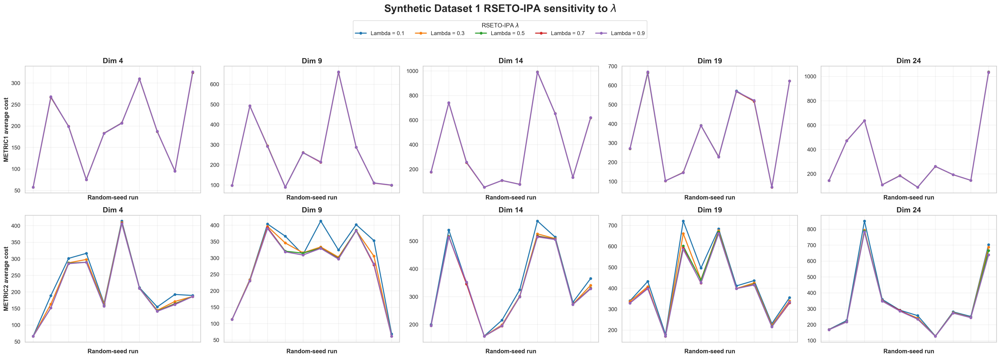

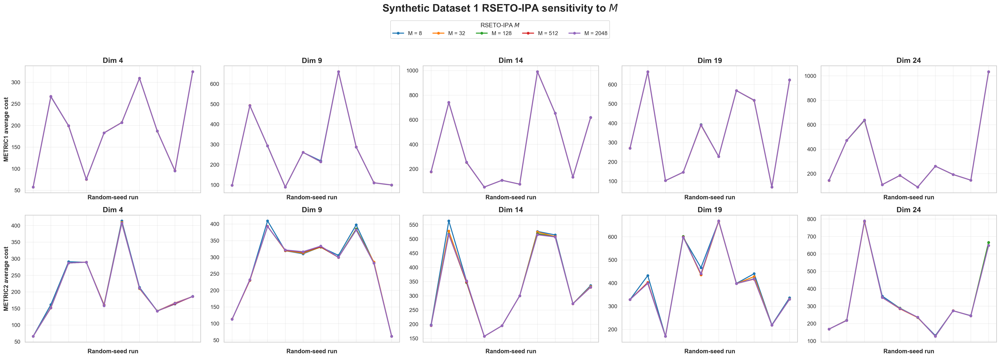

Saved figures to /Users/seinzhou/Desktop/wsc_newexp/results_syn/read_results_syn_analysis/figures


In [5]:
def plot_parameter_profiles_by_seed(sweep, save=True):
    selected = sensitivity_results[sensitivity_results['sweep'] == sweep]
    parameter_values = SWEEP_INFO[sweep]['values']
    symbol = SWEEP_INFO[sweep]['symbol']
    seed_positions = np.arange(len(SEEDS))
    colors = sns.color_palette('tab10', n_colors=len(parameter_values))

    fig, axes = plt.subplots(
        2, len(DIMS), figsize=(28, 10), dpi=220, sharex=True,
    )
    for row, metric in enumerate(['metric1', 'metric2']):
        for col, dim_value in enumerate(DIMS):
            axis = axes[row, col]
            dim_data = selected[selected['dim'] == dim_value]
            for color, parameter_value in zip(colors, parameter_values):
                values = (
                    dim_data[np.isclose(dim_data['parameter'], parameter_value)]
                    .set_index('random_state').reindex(SEEDS)[metric]
                )
                if values.isna().any():
                    raise RuntimeError(
                        f'Missing {sweep}/{metric}/dim={dim_value}/value={parameter_value}.'
                    )
                label = parameter_column_name(sweep, parameter_value).replace(' ', ' = ')
                axis.plot(
                    seed_positions, values.to_numpy(dtype=float), color=color,
                    linewidth=2.0, marker='o', markersize=4.5, label=label,
                )
            axis.set_title(f'Dim {dim_value}', fontsize=15, fontweight='bold')
            axis.set_xticks(seed_positions)
            axis.set_xticklabels([])
            axis.set_xlabel('Random-seed run', fontsize=12, fontweight='bold')
            if col == 0:
                axis.set_ylabel(
                    f'{metric.upper()} average cost', fontsize=12, fontweight='bold'
                )
            axis.grid(True, alpha=0.28)

    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(
        handles, labels, title=f'RSETO-IPA {symbol}', loc='upper center',
        bbox_to_anchor=(0.5, 0.955), ncol=len(parameter_values), frameon=True,
    )
    fig.suptitle(
        f'Synthetic Dataset 1 RSETO-IPA sensitivity to {symbol}',
        fontsize=21, fontweight='bold', y=0.995,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.91])
    if save:
        stem = OUTPUT_ROOT / f'exp5_{sweep}_metric_profiles'
        fig.savefig(stem.with_suffix('.png'), dpi=300, bbox_inches='tight')
        fig.savefig(stem.with_suffix('.pdf'), bbox_inches='tight')
    plt.show()
    return fig

seed_profile_figures = {}
for sweep_name in ['lambda', 'm']:
    seed_profile_figures[sweep_name] = plot_parameter_profiles_by_seed(sweep_name)

print(f'Saved figures to {OUTPUT_ROOT.resolve()}')

## Comprehensive hyperparameter and end-to-end comparison

This figure combines all tested $\lambda$, $M$, and replication-count $R$ settings with GenDFL, Spline QFR, ERM, LightGBM, and Benchmark. Each box uses the ten seed-level observations for one method and feature dimension; no synthetic dispersion is created from summary means.

Prespecified RSETO-IPA reference used for both metrics: (R, M, lambda) = (16, 128, 0.5)


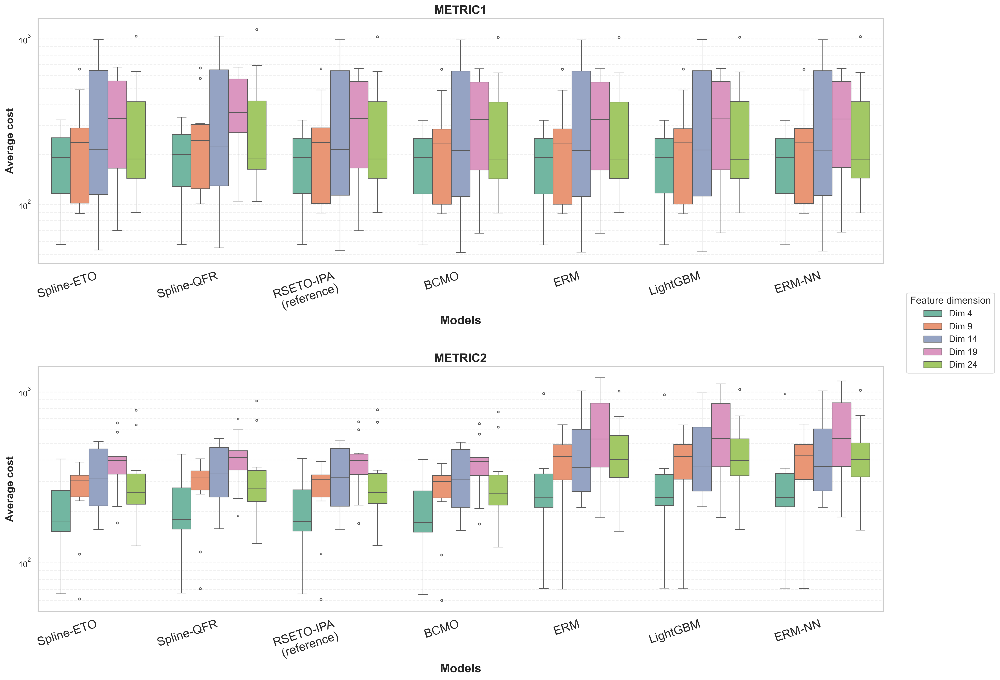

metric1         metric2        
                mean     std    mean     std
method   dim                                
$M=128$  4    190.47   93.31  206.41   97.24
         9    260.37  189.10  272.87  109.12
         14   380.30  337.38  333.93  138.37
         19   358.36  224.35  397.18  152.88
         24   326.74  303.00  335.91  216.88
$M=2048$ 4    190.48   93.35  206.43   97.15
         9    260.44  189.05  273.29  108.97
         14   380.53  337.40  333.87  137.51
         19   358.45  224.50  396.87  152.28
         24   327.24  303.62  334.13  214.20

In [6]:
COMPREHENSIVE_ETE_COLUMNS = ['BCMO', *ETE_COLUMNS]

def build_comprehensive_seed_data():
    frames = []
    sweep_labels = {
        'lambda': lambda value: rf'$\lambda={float(value):.1f}$',
        'm': lambda value: rf'$M={int(value)}$',
        'simulation_num': lambda value: rf'$R={int(value)}$',
    }
    for sweep in ['simulation_num', 'm', 'lambda']:
        for value in SWEEP_INFO[sweep]['values']:
            current = sensitivity_results[
                (sensitivity_results['sweep'] == sweep)
                & np.isclose(sensitivity_results['parameter'], value)
            ][['dim', 'random_state', 'metric1', 'metric2']].copy()
            current['method'] = sweep_labels[sweep](value)
            current['group'] = {
                'lambda': 'Lambda', 'm': 'M', 'simulation_num': 'R'
            }[sweep]
            frames.append(current)

    for frame, method in [(gendfl_spline, 'Spline-ETO'), (results_qfr, 'Spline-QFR')]:
        current = frame[['dim', 'random_state', 'metric1', 'metric2']].copy()
        current['method'] = method
        current['group'] = 'Models'
        frames.append(current)

    current = ete_results[
        ete_results['model'].isin(COMPREHENSIVE_ETE_COLUMNS)
    ].rename(
        columns={'model': 'method'}
    ).copy()
    current['method'] = current['method'].replace({'Benchmark': 'ERM-NN'})
    current['group'] = 'Models'
    frames.append(current)
    return pd.concat(frames, ignore_index=True)

comprehensive_results = build_comprehensive_seed_data()
COMPREHENSIVE_ORDER = (
    [rf'$R={int(value)}$' for value in SWEEP_INFO['simulation_num']['values']]
    + [rf'$M={int(value)}$' for value in SWEEP_INFO['m']['values']]
    + [rf'$\lambda={value:.1f}$' for value in SWEEP_INFO['lambda']['values']]
    + ['Spline-ETO', 'Spline-QFR', 'BCMO', 'ERM', 'LightGBM', 'ERM-NN']
)
expected_comprehensive_rows = len(COMPREHENSIVE_ORDER) * len(DIMS) * len(SEEDS)
assert len(comprehensive_results) == expected_comprehensive_rows
assert not comprehensive_results.duplicated(['method', 'dim', 'random_state']).any()
assert comprehensive_results[['metric1', 'metric2']].notna().all().all()


comprehensive_results_rseto = comprehensive_results[comprehensive_results['method'].str.startswith('$')].copy()
comprehensive_results_rseto_metric_1_min_method = comprehensive_results_rseto.groupby(['method'])['metric1'].mean().idxmin()
comprehensive_results_rseto_metric_2_min_method = comprehensive_results_rseto.groupby(['method'])['metric2'].mean().idxmin()

REFERENCE_RSETO_LABEL = 'RSETO-IPA\n(reference)'
REFERENCE_RSETO_METHOD = r'$R=16$'
REFERENCE_RSETO_BY_METRIC = {
    'metric1': REFERENCE_RSETO_METHOD,
    'metric2': REFERENCE_RSETO_METHOD,
}
BOX_COMPARISON_MODELS = ['Spline-ETO', 'Spline-QFR', 'BCMO', 'ERM', 'LightGBM', 'ERM-NN']

def reference_rseto_axis_label(metric):
    return REFERENCE_RSETO_LABEL

def box_model_order(metric):
    return [
        'Spline-ETO', 'Spline-QFR', reference_rseto_axis_label(metric),
        'BCMO', 'ERM', 'LightGBM', 'ERM-NN',
    ]

def build_reference_box_data(metric):
    comparison = comprehensive_results[
        comprehensive_results['method'].isin(
            BOX_COMPARISON_MODELS
        )
    ].copy()
    reference_method = REFERENCE_RSETO_BY_METRIC[metric]
    reference = comprehensive_results[
        comprehensive_results['method'].eq(reference_method)
    ].copy()
    reference['method'] = reference_rseto_axis_label(metric)
    plot_data = pd.concat([comparison, reference], ignore_index=True)
    expected_rows = len(box_model_order(metric)) * len(DIMS) * len(SEEDS)
    assert len(plot_data) == expected_rows
    assert not plot_data.duplicated(['method', 'dim', 'random_state']).any()
    return plot_data

def plot_comprehensive_box_comparison(save=True):
    hue_order = [f'Dim {value}' for value in DIMS]
    fig, axes = plt.subplots(2, 1, figsize=(17, 13), dpi=300, sharex=False)

    for axis, metric in zip(axes, ['metric1', 'metric2']):
        plot_data = build_reference_box_data(metric)
        plot_data['dimension'] = plot_data['dim'].map(lambda value: f'Dim {int(value)}')
        sns.boxplot(
            data=plot_data, x='method', y=metric, hue='dimension',
            order=box_model_order(metric), hue_order=hue_order,
            palette='Set2', width=0.78, linewidth=0.8, fliersize=2.7,
            ax=axis,
        )
        axis.set_yscale('log')
        axis.set_ylabel('Average cost', fontsize=14, fontweight='bold')
        axis.set_title(metric.upper(), fontsize=16, fontweight='bold')
        axis.grid(True, axis='y', which='both', linestyle='--', alpha=0.28)
        axis.tick_params(axis='x', labelsize=16, rotation=18)
        for label in axis.get_xticklabels():
            label.set_horizontalalignment('right')
        axis.set_xlabel('Models', fontsize=16, fontweight='bold')
        if axis.get_legend() is not None:
            axis.get_legend().remove()

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels, title='Feature dimension', loc='center left',
        bbox_to_anchor=(0.985, 0.5), frameon=True, fontsize=12, title_fontsize=13,
    )
    # fig.suptitle(
    #     'Comprehensive synthetic newsvendor comparison',
    #     fontsize=19, fontweight='bold', y=0.995,
    # )
    fig.tight_layout(rect=[0, 0, 0.975, 0.98], h_pad=3.0)
    if save:
        stem = OUTPUT_ROOT / 'comprehensive_hyperparameter_ete_boxplot'
        fig.savefig(stem.with_suffix('.png'), dpi=300, bbox_inches='tight')
        fig.savefig(stem.with_suffix('.pdf'), bbox_inches='tight')
    plt.show()
    return fig

print('Prespecified RSETO-IPA reference used for both metrics: (R, M, lambda) = (16, 128, 0.5)')
comprehensive_box_figure = plot_comprehensive_box_comparison()
display(
    comprehensive_results.groupby(['method', 'dim'])[['metric1', 'metric2']]
    .agg(['mean', 'std']).round(2).head(10)
)

In [7]:
# LaTeX tables: 5 R columns, 5 M columns, 5 lambda columns, then benchmarks.
LATEX_SWEEP_ORDER = ['simulation_num', 'm', 'lambda']
LATEX_BENCHMARK_ORDER = ['Spline-ETO', 'Spline-QFR', 'BCMO', 'ERM', 'LightGBM', 'ERM-NN']

def build_all_parameter_mean_table(metric):
    blocks = []
    latex_labels = {}
    for sweep in LATEX_SWEEP_ORDER:
        values = SWEEP_INFO[sweep]['values']
        selected = sensitivity_results[sensitivity_results['sweep'] == sweep]
        block = (
            selected.pivot_table(
                index='dim', columns='parameter', values=metric, aggfunc='mean'
            )
            .reindex(index=DIMS, columns=values)
        )
        renamed = []
        for value in values:
            if sweep == 'simulation_num':
                column = f'R {int(value)}'
                latex_labels[column] = rf'$R={int(value)}$'
            elif sweep == 'm':
                column = f'M {int(value)}'
                latex_labels[column] = rf'$M={int(value)}$'
            else:
                column = f'Lambda {float(value):.1f}'
                latex_labels[column] = rf'$\lambda={float(value):.1f}$'
            renamed.append(column)
        block.columns = renamed
        blocks.append(block)

    benchmark_block = (
        comprehensive_results[
            comprehensive_results['method'].isin(LATEX_BENCHMARK_ORDER)
        ]
        .pivot_table(index='dim', columns='method', values=metric, aggfunc='mean')
        .reindex(index=DIMS, columns=LATEX_BENCHMARK_ORDER)
    )
    blocks.append(benchmark_block)
    latex_labels.update({method: method.replace('_', r'\_') for method in LATEX_BENCHMARK_ORDER})

    table = pd.concat(blocks, axis=1)
    if table.shape[1] != 15 + len(LATEX_BENCHMARK_ORDER):
        raise RuntimeError(f'Expected 15 RSETO columns plus benchmarks, got {table.shape[1]}.')
    if table.isna().any().any():
        missing = table.isna().stack()
        raise RuntimeError(f'Missing LaTeX table values: {missing[missing].index.tolist()}')
    return table, latex_labels

def all_parameter_panel_specs():
    return [
        (r'Panel A: Replication count $R$', [f'R {int(value)}' for value in SWEEP_INFO['simulation_num']['values']]),
        (r'Panel B: Samples per replication $M$', [f'M {int(value)}' for value in SWEEP_INFO['m']['values']]),
        (r'Panel C: Gradient weight $\lambda$', [f'Lambda {float(value):.1f}' for value in SWEEP_INFO['lambda']['values']]),
        (r'Panel D: Comparison models', LATEX_BENCHMARK_ORDER),
    ]

def parameter_panel_latex_lines(table, latex_labels, panel_title, columns, row_minima):
    row_end = ' ' + chr(92) * 2
    lines = [
        r'\begin{tabular}{rr' + 'r' * len(columns) + '}',
        r'\toprule',
        rf'\multicolumn{{{len(columns) + 2}}}{{l}}{{\textbf{{{panel_title}}}}}' + row_end,
        r'\midrule',
        'ID & Dim & ' + ' & '.join(latex_labels[column] for column in columns) + row_end,
        r'\midrule',
    ]
    for latex_id, dim in enumerate(DIMS):
        cells = [str(latex_id), str(int(dim))]
        for column in columns:
            value = float(table.loc[dim, column])
            formatted = f'{value:.2f}'
            if np.isclose(value, row_minima.loc[dim], rtol=1e-10, atol=1e-10):
                formatted = rf'\textbf{{{formatted}}}'
            cells.append(formatted)
        lines.append(' & '.join(cells) + row_end)
    lines.extend([r'\bottomrule', r'\end{tabular}'])
    return lines

def all_parameter_latex_code(metric):
    table, latex_labels = build_all_parameter_mean_table(metric)
    metric_label = 'Metric 1' if metric == 'metric1' else 'Metric 2'
    row_minima = table.min(axis=1)
    lines = [
        r'\begin{table}[htbp]',
        r'\centering',
        r'\small',
        r'\setlength{\tabcolsep}{6pt}',
        r'\renewcommand{\arraystretch}{1.08}',
        rf'\caption{{Synthetic-data {metric_label}. Each entry is the mean over ten random seeds.}}',
        rf'\label{{tab:syn_all_parameters_{metric}}}',
    ]
    for panel_index, (panel_title, columns) in enumerate(all_parameter_panel_specs()):
        if panel_index:
            lines.append(r'\par\medskip')
        lines.extend(parameter_panel_latex_lines(
            table, latex_labels, panel_title, columns, row_minima
        ))
    lines.append(r'\end{table}')
    return '\n'.join(lines), table

latex_tables = {}
for metric_name in ['metric1', 'metric2']:
    latex_code, latex_mean_table = all_parameter_latex_code(metric_name)
    latex_tables[metric_name] = latex_code
    output_path = OUTPUT_ROOT / f'comprehensive_{metric_name}_table.tex'
    output_path.write_text(latex_code + '\n', encoding='utf-8')
    print(f'\n% {metric_name.upper()} -- saved to {output_path}')
    print(latex_code)
    for panel_title, columns in all_parameter_panel_specs():
        print(panel_title)
        display(latex_mean_table[columns].round(2))



% METRIC1 -- saved to /Users/seinzhou/Desktop/wsc_newexp/results_syn/read_results_syn_analysis/figures/comprehensive_metric1_table.tex
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic-data Metric 1. Each entry is the mean over ten random seeds.}
\label{tab:syn_all_parameters_metric1}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 190.53 & 190.55 & 190.47 & 190.52 & 190.48 \\
1 & 9 & 260.39 & 260.29 & 260.37 & 260.34 & 260.29 \\
2 & 14 & 380.24 & 380.29 & 380.30 & 380.25 & 380.25 \\
3 & 19 & 358.48 & 358.52 & 358.36 & 358.38 & 358.49 \\
4 & 24 & 326.71 & 326.91 & 326.74 & 326.69 & 326.79 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & 

,R 1,R 4,R 16,R 64,R 256
dim,,,,,
4,190.53,190.55,190.47,190.52,190.48
9,260.39,260.29,260.37,260.34,260.29
14,380.24,380.29,380.30,380.25,380.25
19,358.48,358.52,358.36,358.38,358.49
24,326.71,326.91,326.74,326.69,326.79


Panel B: Samples per replication $M$


,M 8,M 32,M 128,M 512,M 2048
dim,,,,,
4,190.37,190.52,190.47,190.49,190.48
9,260.78,260.44,260.37,260.51,260.44
14,380.51,380.37,380.30,380.32,380.53
19,358.36,358.26,358.36,358.24,358.45
24,326.66,326.62,326.74,327.27,327.24


Panel C: Gradient weight $\lambda$


,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9
dim,,,,,
4,190.49,190.51,190.47,190.55,190.70
9,260.23,260.40,260.37,260.10,260.38
14,380.70,380.37,380.30,380.38,380.81
19,358.63,358.25,358.36,358.69,359.04
24,327.28,327.09,326.74,326.75,326.57


Panel D: Comparison models


,Spline-ETO,Spline-QFR,BCMO,ERM,LightGBM,ERM-NN
dim,,,,,,
4,190.78,201.54,189.66,189.73,190.52,190.63
9,260.45,279.71,258.26,258.37,259.18,259.52
14,382.37,398.91,378.10,378.20,380.47,380.05
19,364.24,393.89,354.77,354.88,357.44,358.06
24,327.94,354.28,323.27,323.68,325.58,326.31



% METRIC2 -- saved to /Users/seinzhou/Desktop/wsc_newexp/results_syn/read_results_syn_analysis/figures/comprehensive_metric2_table.tex
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic-data Metric 2. Each entry is the mean over ten random seeds.}
\label{tab:syn_all_parameters_metric2}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 206.60 & 206.54 & 206.41 & 206.39 & 206.62 \\
1 & 9 & 272.86 & 272.70 & 272.87 & 273.29 & 272.41 \\
2 & 14 & 334.03 & 334.12 & 333.93 & 333.77 & 333.87 \\
3 & 19 & 397.77 & 396.99 & 397.18 & 396.60 & 397.88 \\
4 & 24 & 335.04 & 334.67 & 335.91 & 336.06 & 336.14 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & 

,R 1,R 4,R 16,R 64,R 256
dim,,,,,
4,206.60,206.54,206.41,206.39,206.62
9,272.86,272.70,272.87,273.29,272.41
14,334.03,334.12,333.93,333.77,333.87
19,397.77,396.99,397.18,396.60,397.88
24,335.04,334.67,335.91,336.06,336.14


Panel B: Samples per replication $M$


,M 8,M 32,M 128,M 512,M 2048
dim,,,,,
4,208.80,207.01,206.41,206.33,206.43
9,276.02,272.94,272.87,272.85,273.29
14,341.32,336.30,333.93,333.52,333.87
19,405.71,397.84,397.18,397.02,396.87
24,335.40,335.28,335.91,333.93,334.13


Panel C: Gradient weight $\lambda$


,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9
dim,,,,,
4,220.17,210.02,206.41,205.67,205.40
9,298.82,279.10,272.87,271.39,271.18
14,351.94,336.71,333.93,333.18,333.48
19,428.60,407.89,397.18,393.95,393.27
24,351.57,339.59,335.91,332.25,331.42


Panel D: Comparison models


,Spline-ETO,Spline-QFR,BCMO,ERM,LightGBM,ERM-NN
dim,,,,,,
4,205.37,217.23,203.71,313.57,314.24,314.02
9,271.16,287.57,267.78,383.61,387.32,385.86
14,332.76,345.71,327.82,475.18,474.85,477.49
19,392.77,414.92,386.10,610.47,600.78,610.93
24,331.62,357.41,325.65,461.79,461.25,452.91


In [8]:
comprehensive_results = build_comprehensive_seed_data()
comprehensive_results_rseto = comprehensive_results[comprehensive_results['method'].str.startswith('$')].copy()
comprehensive_results_rseto_metric_1_min_method = comprehensive_results_rseto.groupby(['method'])['metric1'].mean().idxmin()
comprehensive_results_rseto_metric_2_min_method = comprehensive_results_rseto.groupby(['method'])['metric2'].mean().idxmin()
comprehensive_results_rseto_metric_1_min_method

'$R=64$'

## Van Havre complete RSETO-IPA analysis

The following cells read only the consolidated files under `results_syn/consolidated_csv`. They cover all five dimensions, ten random seeds, and five settings for each of $R$, $M$, and $\lambda$, together with Spline-ETO, Spline-QFR, BCMO, ERM, LightGBM, and ERM-NN.

In [9]:
import sys

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from syn_sensitivity_report import (
    build_van_havre_comprehensive_data,
    load_consolidated_results,
    plot_ipa_variance_by_replications,
    plot_simulation_metric_sensitivity,
    plot_van_havre_comprehensive_box,
    plot_van_havre_sweep_profiles,
    van_havre_all_parameter_latex_code,
    variance_reduction_table,
    variance_summary_table,
)

van_havre_results = load_consolidated_results(PROJECT_ROOT)
van_havre_coverage = pd.DataFrame([
    {
        'result': f'Van Havre {sweep}',
        'rows': len(frame),
        'dimensions': frame['dim'].nunique(),
        'seeds': frame['random_state'].nunique(),
        'settings': frame[sweep].nunique(),
    }
    for sweep, frame in van_havre_results['van_sweeps'].items()
])
display(van_havre_coverage)
print('Complete Van Havre workbook:', RESULTS_ROOT / 'van_havre_rseto_ipa_results.xlsx')
print('Complete IPA variance workbook:', RESULTS_ROOT / 'ipa_variance_simulation_sensitivity.xlsx')

,result,rows,dimensions,seeds,settings
0,Van Havre lambda,250,5,10,5
1,Van Havre m,250,5,10,5
2,Van Havre simulation_num,250,5,10,5


Complete Van Havre workbook: /Users/seinzhou/Desktop/wsc_newexp/results_syn/van_havre_rseto_ipa_results.xlsx
Complete IPA variance workbook: /Users/seinzhou/Desktop/wsc_newexp/results_syn/ipa_variance_simulation_sensitivity.xlsx


### Van Havre comprehensive mean tables and LaTeX

Each metric contains 15 RSETO-IPA hyperparameter columns followed by the six comparison models. The LaTeX is split into four readable panels, and each panel's ID starts at 0.

In [10]:
VAN_HAVRE_PANEL_COLUMNS = [
    ('Replication count R', [f'R {value}' for value in [1, 4, 16, 64, 256]]),
    ('Samples per replication M', [f'M {value}' for value in [8, 32, 128, 512, 2048]]),
    ('Gradient weight lambda', [f'Lambda {value:.1f}' for value in [0.1, 0.3, 0.5, 0.7, 0.9]]),
    ('Comparison models', ['Spline-ETO', 'Spline-QFR', 'BCMO', 'ERM', 'LightGBM', 'ERM-NN']),
]
van_havre_latex_tables = {}
for metric in ['metric1', 'metric2']:
    latex_code, mean_table = van_havre_all_parameter_latex_code(
        van_havre_results, metric
    )
    van_havre_latex_tables[metric] = latex_code
    tex_path = OUTPUT_ROOT / f'van_havre_comprehensive_{metric}_table.tex'
    tex_path.write_text(latex_code + '\n', encoding='utf-8')
    print(f'\n{metric.upper()} -- saved to {tex_path}')
    for panel_title, columns in VAN_HAVRE_PANEL_COLUMNS:
        print(panel_title)
        display(mean_table[columns].round(2))
    print(latex_code)


METRIC1 -- saved to /Users/seinzhou/Desktop/wsc_newexp/results_syn/read_results_syn_analysis/figures/van_havre_comprehensive_metric1_table.tex
Replication count R


,R 1,R 4,R 16,R 64,R 256
Dim,,,,,
4,293.30,294.37,293.63,294.14,294.18
9,288.72,288.59,288.41,288.66,288.17
14,293.64,294.69,294.11,294.32,294.14
19,284.71,284.64,284.56,284.74,284.75
24,300.24,300.00,300.11,300.10,300.40


Samples per replication M


,M 8,M 32,M 128,M 512,M 2048
Dim,,,,,
4,288.99,290.64,293.63,294.39,294.37
9,286.47,288.18,288.41,289.75,289.59
14,297.39,295.89,294.11,296.28,296.32
19,284.37,285.46,284.56,284.91,286.41
24,296.94,298.18,300.11,300.13,300.13


Gradient weight lambda


,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9
Dim,,,,,
4,286.88,289.50,293.63,302.35,324.48
9,282.91,284.62,288.41,295.44,316.71
14,288.96,290.54,294.11,305.40,331.15
19,281.62,282.86,284.56,291.01,315.56
24,294.28,296.81,300.11,307.67,325.84


Comparison models


,Spline-ETO,Spline-QFR,BCMO,ERM,LightGBM,ERM-NN
Dim,,,,,,
4,364.97,354.92,256.26,257.21,292.43,262.28
9,346.96,373.59,257.30,260.59,292.35,263.82
14,367.59,364.22,256.21,263.08,300.21,262.32
19,357.07,528.08,256.74,262.21,297.70,261.93
24,378.93,386.47,257.48,267.32,310.68,266.09


\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Van Havre Metric 1. Each entry is the mean over ten random seeds.}
\label{tab:van_havre_all_parameters_metric1}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 293.30 & 294.37 & 293.63 & 294.14 & 294.18 \\
1 & 9 & 288.72 & 288.59 & 288.41 & 288.66 & 288.17 \\
2 & 14 & 293.64 & 294.69 & 294.11 & 294.32 & 294.14 \\
3 & 19 & 284.71 & 284.64 & 284.56 & 284.74 & 284.75 \\
4 & 24 & 300.24 & 300.00 & 300.11 & 300.10 & 300.40 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 288.99 & 290.64 & 293.63 & 294.39 & 294.37 \\
1 & 9 & 286.47 & 288.18 & 288.41 & 289.75 & 289.59 \\
2 & 14

,R 1,R 4,R 16,R 64,R 256
Dim,,,,,
4,167.10,167.30,167.43,167.63,167.56
9,170.53,173.25,172.75,171.81,172.99
14,171.03,172.07,174.45,171.82,171.41
19,173.23,170.62,170.89,171.32,171.84
24,170.73,170.82,170.44,170.56,171.00


Samples per replication M


,M 8,M 32,M 128,M 512,M 2048
Dim,,,,,
4,362.20,209.82,167.43,167.17,167.19
9,253.49,183.96,172.75,168.82,171.59
14,226.37,185.97,174.45,177.40,211.31
19,235.98,194.39,170.89,169.47,169.40
24,245.04,203.25,170.44,169.99,169.90


Gradient weight lambda


,Lambda 0.1,Lambda 0.3,Lambda 0.5,Lambda 0.7,Lambda 0.9
Dim,,,,,
4,252.04,178.93,167.43,164.42,162.77
9,390.43,204.64,172.75,166.73,164.89
14,347.05,246.03,174.45,167.42,166.03
19,467.31,194.32,170.89,167.78,165.47
24,219.05,181.00,170.44,168.99,167.80


Comparison models


,Spline-ETO,Spline-QFR,BCMO,ERM,LightGBM,ERM-NN
Dim,,,,,,
4,162.36,171.96,154.79,1278.95,1025.33,1274.62
9,164.62,171.45,154.33,1268.80,1001.95,1263.17
14,165.22,172.88,155.28,1259.72,1027.75,1280.69
19,165.22,174.61,154.54,1247.76,1001.34,1280.26
24,167.14,174.02,156.12,1243.23,999.42,1270.99


\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Van Havre Metric 2. Each entry is the mean over ten random seeds.}
\label{tab:van_havre_all_parameters_metric2}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 167.10 & 167.30 & 167.43 & 167.63 & 167.56 \\
1 & 9 & 170.53 & 173.25 & 172.75 & 171.81 & 172.99 \\
2 & 14 & 171.03 & 172.07 & 174.45 & 171.82 & 171.41 \\
3 & 19 & 173.23 & 170.62 & 170.89 & 171.32 & 171.84 \\
4 & 24 & 170.73 & 170.82 & 170.44 & 170.56 & 171.00 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 362.20 & 209.82 & 167.43 & 167.17 & 167.19 \\
1 & 9 & 253.49 & 183.96 & 172.75 & 168.82 & 171.59 \\
2 & 14

## IPA variance and simulation-count sensitivity

This is a practical final-checkpoint diagnostic, not a fixed-parameter verification of the theoretical $R^{-1}$ term. For every separately trained $R$-specific checkpoint, the diagnostic fixes the first 16 validation observations and the run's final $m=137$, constructs eight independent unweighted IPA task-gradient vectors, and reports the sum of their coordinatewise sample variances. The figure then uses the geometric mean over ten seeds and $\exp(\overline{\log T}\pm1.96s_{\log T}/\sqrt{10})$ intervals. Because the checkpoint changes with $R$, the curve combines training and estimator effects.

,dataset,simulation_num,metric1_mean,metric1_std,metric1_count,metric2_mean,metric2_std,metric2_count,ipa_gradient_variance_trace_mean,ipa_gradient_variance_trace_std,ipa_gradient_variance_trace_count,weighted_ipa_gradient_variance_trace_mean,weighted_ipa_gradient_variance_trace_std,weighted_ipa_gradient_variance_trace_count
0,exp5,1,303.26991,245.11272,50,309.26258,156.85428,50,97.77775,250.91568,50,24.44444,62.72892,50
1,exp5,4,303.31311,245.20704,50,309.00670,156.26884,50,28.61299,68.82404,50,7.15325,17.20601,50
2,exp5,16,303.24977,245.14737,50,309.26168,156.99948,50,6.40679,16.19995,50,1.60170,4.04999,50
3,exp5,64,303.23652,245.16211,50,309.21934,156.91222,50,1.33473,3.23900,50,0.33368,0.80975,50
4,exp5,256,303.26218,245.17803,50,309.38440,157.16499,50,0.41419,1.11157,50,0.10355,0.27789,50
5,van_havre,1,292.12171,15.28237,50,170.52310,13.43966,50,28.81070,100.84039,50,7.20267,25.21010,50
6,van_havre,4,292.45831,15.95903,50,170.81241,12.44507,50,49.93642,293.48510,50,12.48411,73.37127,50
7,van_havre,16,292.16547,15.61524,50,171.19197,13.10293,50,6.38862,26.24137,50,1.59715,6.56034,50
8,van_havre,64,292.39063,15.74884,50,170.62928,12.10935,50,3.64654,13.44332,50,0.91164,3.36083,50
9,van_havre,256,292.32784,15.79453,50,170.96146,12.39000,50,0.78139,2.45395,50,0.19535,0.61349,50


,dataset,simulation_num,ipa_gradient_variance_trace_mean,ipa_gradient_variance_trace_std,ipa_gradient_variance_trace_count,variance_relative_to_R1,variance_reduction_vs_R1_pct,R_times_variance,metric1_mean,metric2_mean
0,exp5,1,97.778,250.92,50,1.0000,0.00,97.778,303.270,309.263
1,exp5,4,28.613,68.824,50,0.2926,70.74,114.45,303.313,309.007
2,exp5,16,6.4068,16.2,50,0.0655,93.45,102.51,303.250,309.262
3,exp5,64,1.3347,3.239,50,0.0137,98.63,85.423,303.237,309.219
4,exp5,256,0.41419,1.1116,50,0.0042,99.58,106.03,303.262,309.384
5,van_havre,1,28.811,100.84,50,1.0000,0.00,28.811,292.122,170.523
6,van_havre,4,49.936,293.49,50,1.7333,-73.33,199.75,292.458,170.812
7,van_havre,16,6.3886,26.241,50,0.2217,77.83,102.22,292.165,171.192
8,van_havre,64,3.6465,13.443,50,0.1266,87.34,233.38,292.391,170.629
9,van_havre,256,0.78139,2.4539,50,0.0271,97.29,200.04,292.328,170.961


\begin{tabular}{lrrrrrrrrr}
\toprule
dataset & simulation_num & ipa_gradient_variance_trace_mean & ipa_gradient_variance_trace_std & ipa_gradient_variance_trace_count & variance_relative_to_R1 & variance_reduction_vs_R1_pct & R_times_variance & metric1_mean & metric2_mean \\
\midrule
exp5 & 1 & 97.78 & 250.9 & 50 & 1 & 0 & 97.78 & 303.3 & 309.3 \\
exp5 & 4 & 28.61 & 68.82 & 50 & 0.2926 & 70.74 & 114.5 & 303.3 & 309 \\
exp5 & 16 & 6.407 & 16.2 & 50 & 0.06552 & 93.45 & 102.5 & 303.2 & 309.3 \\
exp5 & 64 & 1.335 & 3.239 & 50 & 0.01365 & 98.63 & 85.42 & 303.2 & 309.2 \\
exp5 & 256 & 0.4142 & 1.112 & 50 & 0.004236 & 99.58 & 106 & 303.3 & 309.4 \\
van_havre & 1 & 28.81 & 100.8 & 50 & 1 & 0 & 28.81 & 292.1 & 170.5 \\
van_havre & 4 & 49.94 & 293.5 & 50 & 1.733 & -73.33 & 199.7 & 292.5 & 170.8 \\
van_havre & 16 & 6.389 & 26.24 & 50 & 0.2217 & 77.83 & 102.2 & 292.2 & 171.2 \\
van_havre & 64 & 3.647 & 13.44 & 50 & 0.1266 & 87.34 & 233.4 & 292.4 & 170.6 \\
van_havre & 256 & 0.7814 & 2.454 & 50 & 0

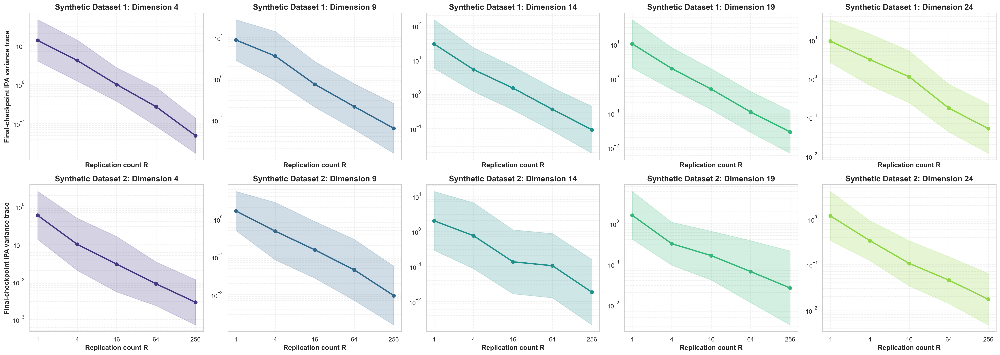

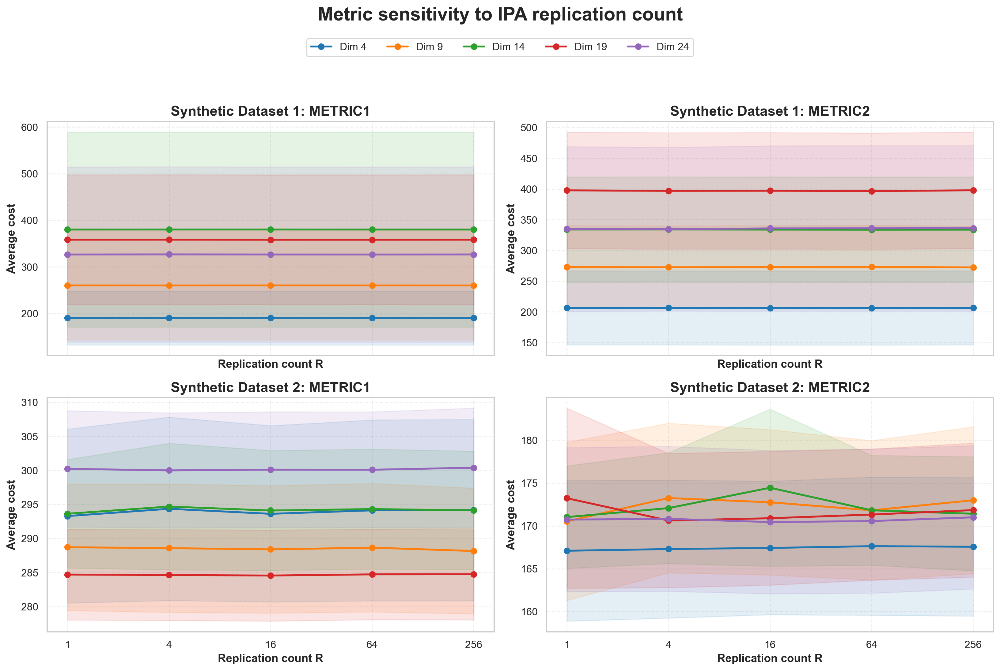

In [11]:
ipa_variance_summary = variance_summary_table(van_havre_results)
ipa_variance_analysis = variance_reduction_table(van_havre_results)
display(ipa_variance_summary.style.format(precision=5))
display(ipa_variance_analysis.style.format({
    'ipa_gradient_variance_trace_mean': '{:.5g}',
    'ipa_gradient_variance_trace_std': '{:.5g}',
    'variance_relative_to_R1': '{:.4f}',
    'variance_reduction_vs_R1_pct': '{:.2f}',
    'R_times_variance': '{:.5g}',
    'metric1_mean': '{:.3f}',
    'metric2_mean': '{:.3f}',
}))
ipa_variance_summary.to_csv(OUTPUT_ROOT / 'ipa_variance_simulation_summary.csv', index=False)
ipa_variance_analysis.to_csv(OUTPUT_ROOT / 'ipa_variance_reduction_analysis.csv', index=False)
print(ipa_variance_analysis.to_latex(index=False, float_format=lambda value: f'{value:.4g}'))

ipa_variance_figure = plot_ipa_variance_by_replications(
    van_havre_results, OUTPUT_ROOT
)
plt.show()

simulation_metric_figure = plot_simulation_metric_sensitivity(
    van_havre_results, OUTPUT_ROOT
)
plt.show()

## Van Havre seed-level sensitivity figures

These three figures show Metric 1 and Metric 2 for every paired random-seed run, with one column per feature dimension.

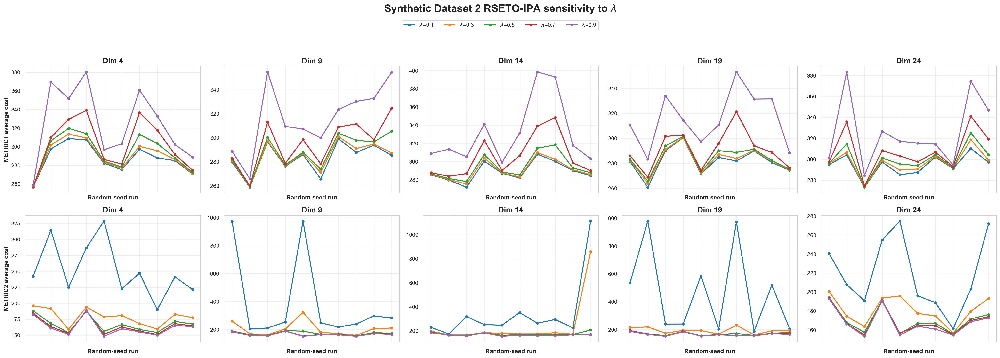

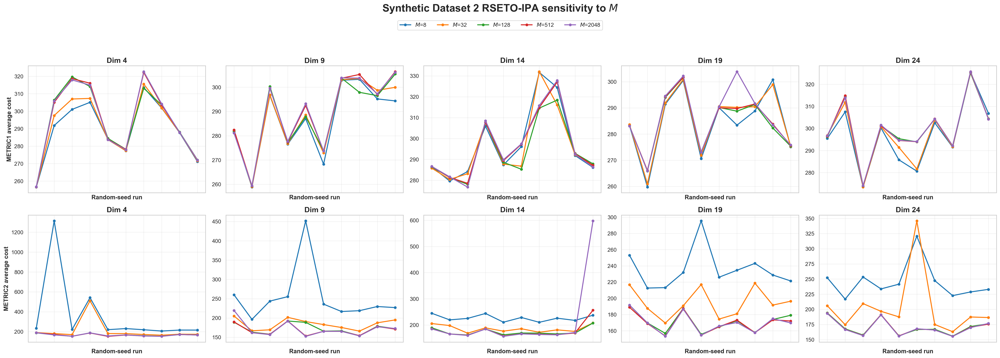

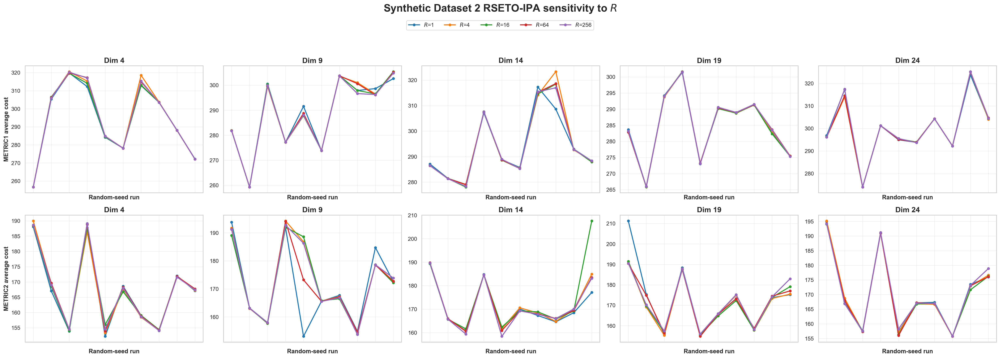

In [12]:
van_havre_profile_figures = {}
for sweep in ['lambda', 'm', 'simulation_num']:
    van_havre_profile_figures[sweep] = plot_van_havre_sweep_profiles(
        van_havre_results, sweep=sweep, output_dir=OUTPUT_ROOT
    )
    plt.show()

## Van Havre comprehensive model comparison

Every comparison panel uses the prespecified RSETO-IPA reference configuration $(R,M,\lambda)=(16,128,0.5)$. The separate $\lambda$ and other hyperparameter trade-offs are reported only in the sensitivity analysis.

,metric1,metric2
selected setting,R=16,R=16


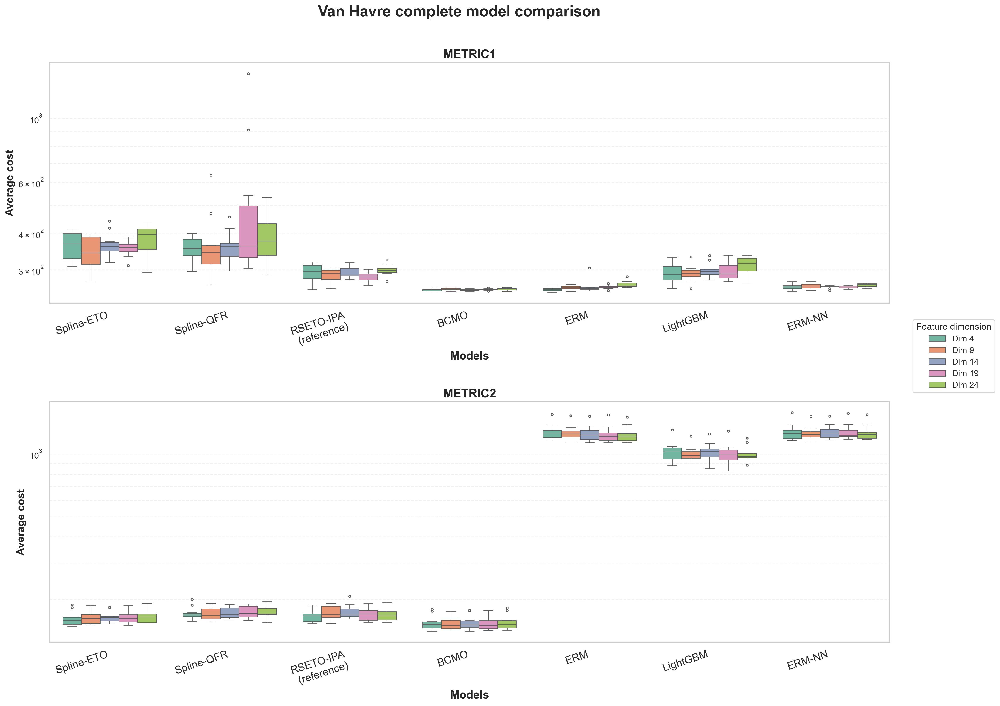

In [13]:
van_havre_model_data, van_havre_reference = build_van_havre_comprehensive_data(
    van_havre_results
)
display(pd.DataFrame([van_havre_reference], index=['selected setting']))
van_havre_model_data.to_csv(
    OUTPUT_ROOT / 'van_havre_comprehensive_model_data.csv', index=False
)
pd.DataFrame([van_havre_reference]).to_csv(
    OUTPUT_ROOT / 'van_havre_reference_rseto_parameters.csv', index=False
)
van_havre_boxplot = plot_van_havre_comprehensive_box(
    van_havre_results, OUTPUT_ROOT
)
plt.show()

## difference_output_bcmo

Every difference below is paired by dataset, dimension, and random seed:

$$\Delta_{m,s}=\operatorname{cost}_{m,s}-\operatorname{cost}_{\mathrm{BCMO},s}.$$

Negative values outperform BCMO. The standalone BCMO column is omitted because its paired difference is identically zero.

In [14]:
import sys

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from bcmo_difference_report import build_all_outputs

bcmo_difference_results = build_all_outputs(PROJECT_ROOT)
plt.close(bcmo_difference_results['figure'])
BCMO_DIFFERENCE_OUTPUT = bcmo_difference_results['output_dir']
display(bcmo_difference_results['reference_parameters'])
print(f'BCMO difference outputs: {BCMO_DIFFERENCE_OUTPUT}')

,dataset,metric1,metric2
0,exp5,"R=64, M=128, lambda=0.5","R=16, M=128, lambda=0.9"
1,van_havre,"R=16, M=128, lambda=0.1","R=16, M=128, lambda=0.9"


BCMO difference outputs: /Users/seinzhou/Desktop/wsc_newexp/results_syn/difference_output_bcmo


### Mean difference tables and LaTeX code

Each panel is the mean paired difference over ten random seeds. IDs restart from 0 in every panel, and the smallest mean in each dimension is bolded.

In [15]:
bcmo_panels = {
    'Panel A: simulation number R': [f'R={v}' for v in [1, 4, 16, 64, 256]],
    'Panel B: samples per replication M': [f'M={v}' for v in [8, 32, 128, 512, 2048]],
    'Panel C: regularization lambda': [f'lambda={v:g}' for v in [0.1, 0.3, 0.5, 0.7, 0.9]],
    'Panel D: comparison models': ['Spline-ETO', 'Spline-QFR', 'ERM', 'LightGBM', 'ERM-NN'],
}

for dataset_key, dataset_label in [('exp5', 'Exp5'), ('van_havre', 'Van Havre')]:
    for metric_key, metric_label in [('metric1', 'Metric 1'), ('metric2', 'Metric 2')]:
        mean_table = bcmo_difference_results['mean_tables'][(dataset_key, metric_key)]
        print(f'\n### {dataset_label} - {metric_label}: model minus BCMO')
        for panel_label, panel_columns in bcmo_panels.items():
            print(panel_label)
            display(mean_table[panel_columns].reset_index().round(2))
        print('LaTeX code:')
        print(bcmo_difference_results['latex_codes'][(dataset_key, metric_key)])


### Exp5 - Metric 1: model minus BCMO
Panel A: simulation number R


method,Dim,R=1,R=4,R=16,R=64,R=256
0,4,0.87,0.89,0.81,0.86,0.83
1,9,2.13,2.03,2.12,2.08,2.03
2,14,2.14,2.20,2.21,2.15,2.15
3,19,3.71,3.76,3.60,3.61,3.72
4,24,3.44,3.64,3.47,3.42,3.53


Panel B: samples per replication M


method,Dim,M=8,M=32,M=128,M=512,M=2048
0,4,0.72,0.86,0.81,0.84,0.82
1,9,2.52,2.18,2.12,2.26,2.18
2,14,2.41,2.28,2.21,2.23,2.44
3,19,3.59,3.49,3.60,3.47,3.68
4,24,3.39,3.35,3.47,4.00,3.97


Panel C: regularization lambda


method,Dim,lambda=0.1,lambda=0.3,lambda=0.5,lambda=0.7,lambda=0.9
0,4,0.83,0.85,0.81,0.89,1.04
1,9,1.98,2.14,2.12,1.85,2.13
2,14,2.60,2.27,2.21,2.29,2.72
3,19,3.86,3.49,3.60,3.92,4.27
4,24,4.01,3.82,3.47,3.48,3.30


Panel D: comparison models


method,Dim,Spline-ETO,Spline-QFR,ERM,LightGBM,ERM-NN
0,4,1.12,11.88,0.07,0.87,0.97
1,9,2.19,21.45,0.11,0.92,1.26
2,14,4.27,20.82,0.10,2.37,1.95
3,19,9.47,39.12,0.11,2.67,3.29
4,24,4.67,31.01,0.41,2.31,3.04


LaTeX code:
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic Dataset 1 Metric 1 cost difference relative to BCMO. Negative values outperform BCMO.}
\label{tab:synthetic_dataset_1_bcmo_difference_metric1}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 0.87 & 0.89 & 0.81 & 0.86 & 0.83 \\
1 & 9 & 2.13 & 2.03 & 2.12 & 2.08 & 2.03 \\
2 & 14 & 2.14 & 2.20 & 2.21 & 2.15 & 2.15 \\
3 & 19 & 3.71 & 3.76 & 3.60 & 3.61 & 3.72 \\
4 & 24 & 3.44 & 3.64 & 3.47 & 3.42 & 3.53 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 0.72 & 0.86 & 0.81 & 0.84 & 0.82 \\
1 & 9 & 2.52 & 2.18 & 2.12 & 2.26 & 2.18 \\
2 & 14 & 2.41 & 2.28 & 

method,Dim,R=1,R=4,R=16,R=64,R=256
0,4,2.89,2.84,2.71,2.68,2.91
1,9,5.09,4.93,5.10,5.51,4.63
2,14,6.21,6.30,6.10,5.94,6.05
3,19,11.67,10.89,11.08,10.50,11.78
4,24,9.39,9.02,10.26,10.41,10.49


Panel B: samples per replication M


method,Dim,M=8,M=32,M=128,M=512,M=2048
0,4,5.09,3.30,2.71,2.62,2.72
1,9,8.24,5.16,5.10,5.07,5.52
2,14,13.50,8.48,6.10,5.69,6.04
3,19,19.61,11.74,11.08,10.92,10.77
4,24,9.75,9.63,10.26,8.28,8.48


Panel C: regularization lambda


method,Dim,lambda=0.1,lambda=0.3,lambda=0.5,lambda=0.7,lambda=0.9
0,4,16.46,6.31,2.71,1.96,1.69
1,9,31.04,11.32,5.10,3.62,3.40
2,14,24.12,8.89,6.10,5.36,5.66
3,19,42.50,21.79,11.08,7.85,7.16
4,24,25.92,13.94,10.26,6.60,5.77


Panel D: comparison models


method,Dim,Spline-ETO,Spline-QFR,ERM,LightGBM,ERM-NN
0,4,1.66,13.52,109.86,110.53,110.31
1,9,3.38,19.80,115.83,119.54,118.08
2,14,4.94,17.88,147.35,147.03,149.67
3,19,6.67,28.82,224.37,214.68,224.83
4,24,5.97,31.76,136.14,135.60,127.26


LaTeX code:
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic Dataset 1 Metric 2 cost difference relative to BCMO. Negative values outperform BCMO.}
\label{tab:synthetic_dataset_1_bcmo_difference_metric2}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 2.89 & 2.84 & 2.71 & 2.68 & 2.91 \\
1 & 9 & 5.09 & 4.93 & 5.10 & 5.51 & 4.63 \\
2 & 14 & 6.21 & 6.30 & 6.10 & 5.94 & 6.05 \\
3 & 19 & 11.67 & 10.89 & 11.08 & 10.50 & 11.78 \\
4 & 24 & 9.39 & 9.02 & 10.26 & 10.41 & 10.49 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 5.09 & 3.30 & 2.71 & 2.62 & 2.72 \\
1 & 9 & 8.24 & 5.16 & 5.10 & 5.07 & 5.52 \\
2 & 14 & 13.50 

method,Dim,R=1,R=4,R=16,R=64,R=256
0,4,37.04,38.11,37.37,37.88,37.92
1,9,31.43,31.29,31.11,31.36,30.87
2,14,37.43,38.49,37.91,38.11,37.93
3,19,27.97,27.90,27.82,28.00,28.01
4,24,42.75,42.52,42.63,42.62,42.92


Panel B: samples per replication M


method,Dim,M=8,M=32,M=128,M=512,M=2048
0,4,32.73,34.39,37.37,38.14,38.11
1,9,29.17,30.88,31.11,32.46,32.29
2,14,41.18,39.68,37.91,40.07,40.11
3,19,27.63,28.72,27.82,28.16,29.67
4,24,39.46,40.70,42.63,42.65,42.64


Panel C: regularization lambda


method,Dim,lambda=0.1,lambda=0.3,lambda=0.5,lambda=0.7,lambda=0.9
0,4,30.62,33.24,37.37,46.10,68.22
1,9,25.61,27.32,31.11,38.14,59.41
2,14,32.75,34.33,37.91,49.20,74.94
3,19,24.88,26.12,27.82,34.27,58.82
4,24,36.80,39.33,42.63,50.18,68.36


Panel D: comparison models


method,Dim,Spline-ETO,Spline-QFR,ERM,LightGBM,ERM-NN
0,4,108.71,98.67,0.96,36.17,6.03
1,9,89.66,116.29,3.29,35.06,6.52
2,14,111.39,108.02,6.87,44.00,6.11
3,19,100.32,271.34,5.47,40.95,5.19
4,24,121.45,128.99,9.84,53.19,8.60


LaTeX code:
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic Dataset 2 Metric 1 cost difference relative to BCMO. Negative values outperform BCMO.}
\label{tab:synthetic_dataset_2_bcmo_difference_metric1}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 37.04 & 38.11 & 37.37 & 37.88 & 37.92 \\
1 & 9 & 31.43 & 31.29 & 31.11 & 31.36 & 30.87 \\
2 & 14 & 37.43 & 38.49 & 37.91 & 38.11 & 37.93 \\
3 & 19 & 27.97 & 27.90 & 27.82 & 28.00 & 28.01 \\
4 & 24 & 42.75 & 42.52 & 42.63 & 42.62 & 42.92 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 32.73 & 34.39 & 37.37 & 38.14 & 38.11 \\
1 & 9 & 29.17 & 30.88 & 31.11 & 32.46

method,Dim,R=1,R=4,R=16,R=64,R=256
0,4,12.31,12.51,12.64,12.85,12.78
1,9,16.21,18.92,18.42,17.49,18.66
2,14,15.74,16.79,19.16,16.53,16.13
3,19,18.69,16.08,16.35,16.78,17.30
4,24,14.61,14.70,14.32,14.44,14.88


Panel B: samples per replication M


method,Dim,M=8,M=32,M=128,M=512,M=2048
0,4,207.41,55.04,12.64,12.38,12.40
1,9,99.17,29.63,18.42,14.50,17.27
2,14,71.09,30.69,19.16,22.12,56.02
3,19,81.44,39.85,16.35,14.93,14.86
4,24,88.92,47.13,14.32,13.87,13.77


Panel C: regularization lambda


method,Dim,lambda=0.1,lambda=0.3,lambda=0.5,lambda=0.7,lambda=0.9
0,4,97.25,24.14,12.64,9.64,7.98
1,9,236.11,50.31,18.42,12.40,10.56
2,14,191.77,90.74,19.16,12.14,10.74
3,19,312.77,39.78,16.35,13.24,10.93
4,24,62.93,24.88,14.32,12.87,11.68


Panel D: comparison models


method,Dim,Spline-ETO,Spline-QFR,ERM,LightGBM,ERM-NN
0,4,7.58,17.17,1124.17,870.55,1119.84
1,9,10.30,17.12,1114.47,847.62,1108.84
2,14,9.94,17.60,1104.43,872.46,1125.41
3,19,10.68,20.07,1093.22,846.80,1125.72
4,24,11.02,17.90,1087.11,843.30,1114.87


LaTeX code:
\begin{table}[htbp]
\centering
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.08}
\caption{Synthetic Dataset 2 Metric 2 cost difference relative to BCMO. Negative values outperform BCMO.}
\label{tab:synthetic_dataset_2_bcmo_difference_metric2}
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel A: Replication count $R$}} \\
\midrule
ID & Dim & $R=1$ & $R=4$ & $R=16$ & $R=64$ & $R=256$ \\
\midrule
0 & 4 & 12.31 & 12.51 & 12.64 & 12.85 & 12.78 \\
1 & 9 & 16.21 & 18.92 & 18.42 & 17.49 & 18.66 \\
2 & 14 & 15.74 & 16.79 & 19.16 & 16.53 & 16.13 \\
3 & 19 & 18.69 & 16.08 & 16.35 & 16.78 & 17.30 \\
4 & 24 & 14.61 & 14.70 & 14.32 & 14.44 & 14.88 \\
\bottomrule
\end{tabular}
\par\medskip
\begin{tabular}{rrrrrrr}
\toprule
\multicolumn{7}{l}{\textbf{Panel B: Samples per replication $M$}} \\
\midrule
ID & Dim & $M=8$ & $M=32$ & $M=128$ & $M=512$ & $M=2048$ \\
\midrule
0 & 4 & 207.41 & 55.04 & 12.64 & 12.38 & 12.40 \\
1 & 9 & 99.17 & 29.63 & 18.42 & 14.5

### Paired-difference boxplots

The dashed horizontal line is the BCMO reference at zero. BCMO is not drawn as a separate boxplot column. Every panel uses the same prespecified RSETO-IPA configuration $(R,M,\lambda)=(16,128,0.5)$.

,dataset,metric1,metric2
0,exp5,"R=64, M=128, lambda=0.5","R=16, M=128, lambda=0.9"
1,van_havre,"R=16, M=128, lambda=0.1","R=16, M=128, lambda=0.9"


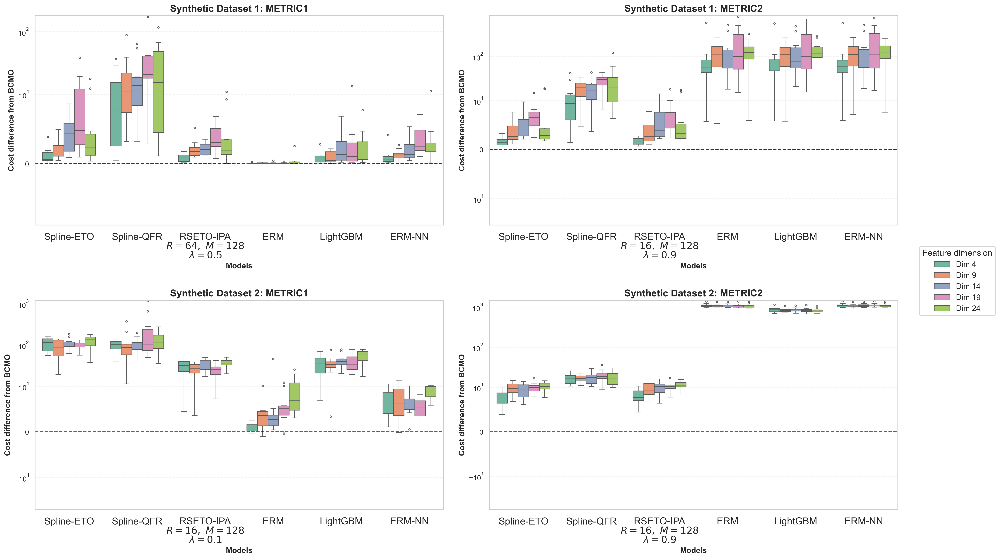

/Users/seinzhou/Desktop/wsc_newexp/results_syn/difference_output_bcmo/bcmo_difference_boxplot.png


In [16]:
display(bcmo_difference_results['reference_parameters'])
display(bcmo_difference_results['figure'])
print(BCMO_DIFFERENCE_OUTPUT / 'bcmo_difference_boxplot.png')